# 📚  Exercise Diffusers

Introduction to the `diffusers` Library](#task_name_1)
    - [Subtask A: Running Stable Diffusion](#subtask_name_1_A)
    - [Subtask B: Classifier-Free Guidance Experiments](#subtask_name_1_B)


Install the following packages (already installed in Colab):

In [2]:
%%writefile requirements.txt
torch
matplotlib
scikit-learn
diffusers
transformers
scipy
ftfy
accelerate

Overwriting requirements.txt


In [3]:
!pip install -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.8 MB/s eta 0:00:00


Import some libs:

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina' # make plots prettier

<a name="task_name_1"></a>
## Task 1: Introduction to the `diffusers` Library

In this task, we will go through some basics of `diffusers` library. More specifically, we will work with the [Stable Diffusion](https://arxiv.org/abs/2112.10752) model.

Stable Diffusion is an advanced version of DDPM that operates in the latent space rather than in the image-pixel space. This is achieved by using [Variational AutoEncoder (VAE)](https://arxiv.org/abs/1312.6114) that compresses image into a latent representation, which will then undergo diffusion forward process. The denoised latent is passed to VAE decoder to gen the final image. As before, UNet is used for denoising, however, cross-attention with a text (prompt) encoder is added for conditioning. Working in the latent space significantly cuts computational costs of running the model (by working with $64\times64$ dimension instead of $512\times512$, e.g.) enabling generation of high-resolution images.

`diffusers`, like `transformers` for sequential tasks, is a special lib written by HuggingFace that provides a framework for running and training diffusion models. For example, running Stable Diffusion is not harder than just importing a couple of lines:

In [5]:
import torch
from diffusers import StableDiffusionPipeline

# we load the model in fp16 to reduce computational burden
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", dtype=torch.float16)

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Keyword arguments {'dtype': torch.float16} are not expected by StableDiffusionPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/133a221b8aa7292a167afc5127cb63fb5005638b/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/133a221b8aa7292a167afc5127cb63fb5005638b/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


In [6]:
device = "cuda" if torch.cuda.is_available() else "cpu"
pipe = pipe.to(device)

  0%|          | 0/50 [00:00<?, ?it/s]

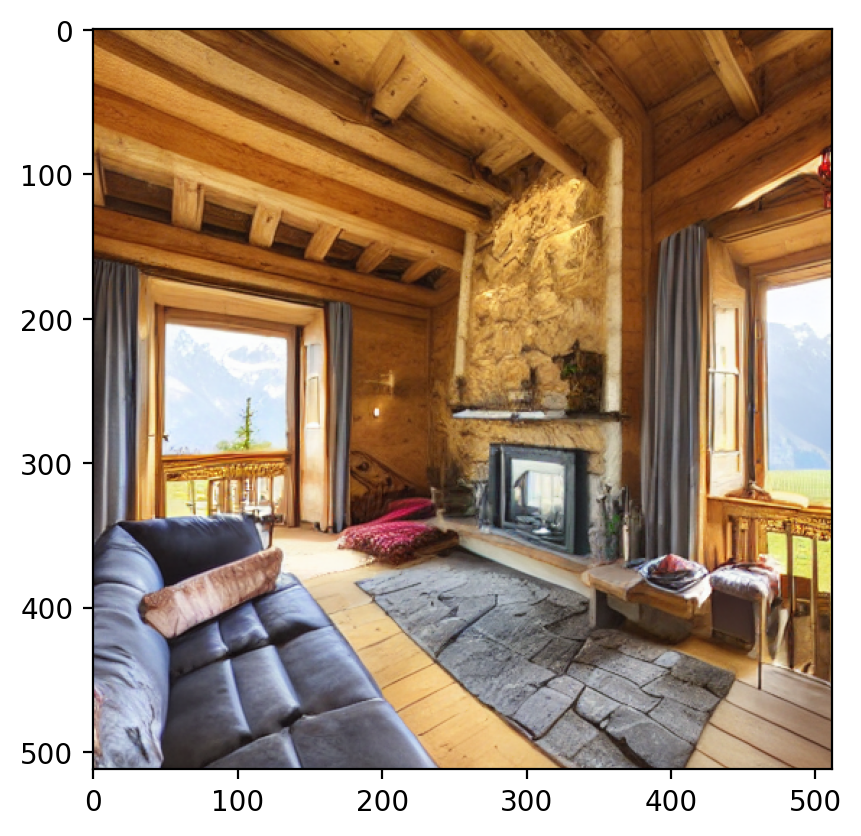

In [7]:
prompt = "House of a Swiss Family in the Swiss Alps, scenic view, beautiful lighting, ultra detailed, 8k"
image = pipe(prompt).images[0] # in PIL format

plt.imshow(image)

Due to randomness, the result will be different each time

  0%|          | 0/50 [00:00<?, ?it/s]

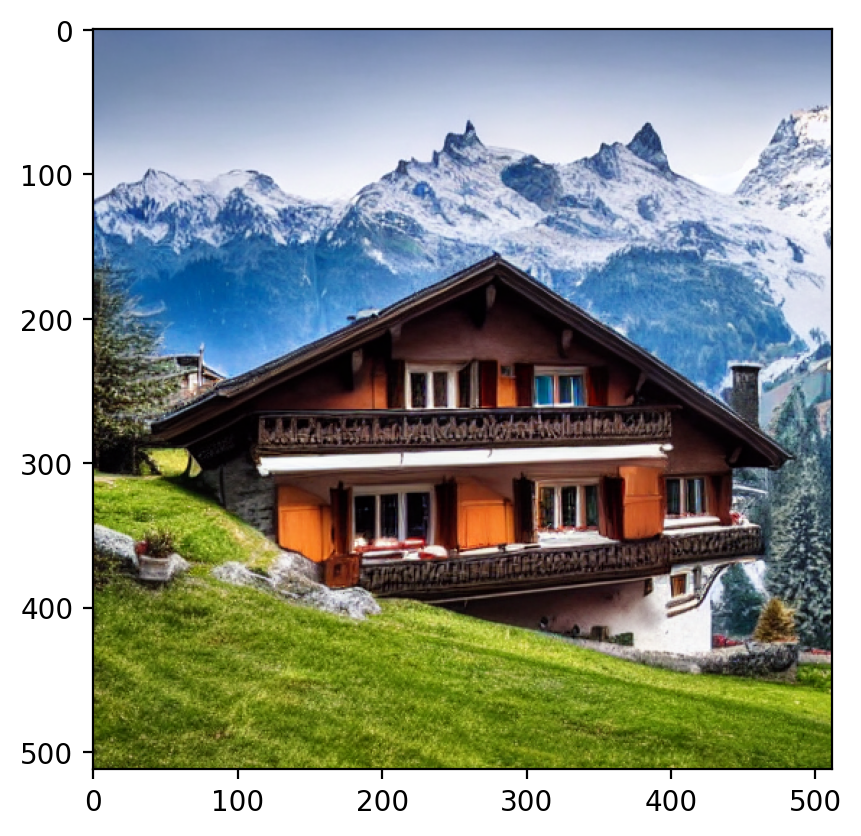

In [8]:
image = pipe(prompt).images[0] # in PIL format

plt.imshow(image)

<a name="subtask_name_1_A"></a>
## Task 1.A: Running Stable Diffusion

What is happening inside the pipeline? Let's load its components ourselves and try to recreate the pipeline we saw.

As described before, Stable Diffusion uses a VAE for encoding image into latent representation. During inference, we start with random noise (which lives in the latent domain) and denoise it using UNet. Unet is conditioned on text embeddings obtained using pre-trained frozen text-encoder. See the diagram below:

<p align="left">
<img src="https://raw.githubusercontent.com/patrickvonplaten/scientific_images/master/stable_diffusion.png" alt="sd-pipeline" width="500"/>
</p>

In the Task 1, we denoised input for all 1000 steps. However, it is not mandatory. There exist scheduler solvers that enable the user to skip some steps during inference (though this speed may come in trade-off to quality). The general idea is the following:

From Eq. 4 ($q(x_t|x_0)$) of the DDPM paper we know:

$$
x_{\tau} = \sqrt{\overline{\alpha_{\tau}}}x_0 + \sqrt{1-\overline{\alpha_{\tau}}}\epsilon \quad \forall \tau \tag{*}
$$

This allows us to approximate $x_0$ given $x_t$ (Eq. 11):

$$
\hat{x_0} = \frac{1}{\sqrt{̅\overline{\alpha_t}}}\left(x_t - \sqrt{1-\overline{\alpha_t}}\epsilon\right)
$$

Since $(*)$ is true for all $\tau$. We can compute $\hat{x_0}$ for $t$ and plug it in $(*)$ for $\tau < t$ instead of real $x_0$:

$$
x_{\tau} = \sqrt{\overline{\alpha_{\tau}}}\hat{x_0} + \sqrt{1-\overline{\alpha_{\tau}}}\epsilon
$$

Because the noisier the image is, the worse is the $\hat{x_0}$ approximation of $x_0$, we do not jump directly from $T=1000$ step to $\tau = 0$. However, we can skip some steps, e.g., skip every 50 steps and do only $\frac{1000}{50}$ steps in total.

**Note**: during training, we randomly choose $t$ each time, meaning that we cover all possible $\tau$ from $0$ to $1000$ and therefore can do this for any of the valid $\tau$.

For more details, you can read [Denoising Diffusion Implicit Models (DDIM)](https://arxiv.org/abs/2010.02502). Different solver variations exist. See https://huggingface.co/docs/diffusers/api/schedulers/overview

So, to run Stable Diffusion, we need VAE, UNet, TextEncoder and Scheduler. We can get all of this from corresponding **subfolders** of the stable diffusion repo:

In [14]:
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler

# 1. Load the autoencoder model which will be used to decode the latents into image space.
# HINT, use the HF repo we used above for the pipeline and indicate the corresponding subfolder=
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# 2. Load the tokenizer and text encoder to tokenize and encode the text.
# tokenizer: text -> ids
# text_encoder: ids -> embeddings
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:202: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: openai/clip-vit-large-patch14
Key                                                            | Status     |  | 
---------------------------------------------------------------+------------+--+-
vision_model.encoder.layers.{0...23}.self_attn.q_proj.weight   | UNEXPECTED |  | 
vision_model.encoder.layers.{0...23}.layer_norm1.weight        | UNEXPECTED |  | 
vision_model.encoder.layers.{0...23}.self_attn.k_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...23}.layer_norm1.bias          | UNEXPECTED |  | 
vision_model.encoder.layers.{0...23}.mlp.fc1.weight            | UNEXPECTED |  | 
vision_model.encoder.layers.{0...23}.mlp.fc2.weight            | UNEXPECTED |  | 
vision_model.encoder.layers.{0...23}.layer_norm2.bias          | UNEXPECTED |  | 
vision_model.encoder.layers.{0...23}.self_attn.q_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...23}.self_attn.v_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...23}

In [15]:
vae = vae.to(device)
text_encoder = text_encoder.to(device)
unet = unet.to(device)

During training, we train with steps from $0$ to $1000$ anyway. Scheduler solvers are only about inference. So we can actually choose any. Let's use LMSDiscreteScheduler for example

In [16]:
from diffusers import DDIMScheduler

scheduler = DDIMScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")

We can choose how many steps we want to do during inference (speed -- quality trade-off)

In [17]:
num_inference_steps = 100
scheduler.set_timesteps(num_inference_steps)

In [22]:
prompt = "House of a Swiss Family in the Swiss Alps, scenic view, beautiful lighting, ultra detailed, 8k"

def get_text_embeddings(prompt):
    # Apply tokenizer and text encoder on prompt
    # pad prompt to tokenizer.model_max_length
    text_ids = tokenizer(
        prompt,
        padding="max_length",
        max_length=tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt"
    ).input_ids.to("cuda")
    # pass input_ids to text encoder
    with torch.no_grad():
        text_embeddings = text_encoder(text_ids)[0]
    return text_embeddings

text_embeddings = get_text_embeddings(prompt)

Now we have all the modules. Let's combine them:

In [23]:
text_embeddings.shape

torch.Size([1, 77, 768])

In [25]:
# initialize random noise in the latent domain
# recall that latent domain reduces width\height by a factor of 8

batch_size = 1
in_channels = unet.config.in_channels
height = 512
width = 512

def get_latents():
    latents = torch.randn(
      batch_size, in_channels, height // 8, width // 8
    )
    latents = latents.to(device)
    return latents

latents = get_latents()

Denoise latents using each $t$ from `scheduler.timesteps`:

In [26]:
from tqdm.auto import tqdm

for t in tqdm(scheduler.timesteps):
  # predict the noise residual
  with torch.no_grad():
    # pass text_embeddings as encoder_hidden_states
    # predictions from the model is called .sample
    noise_pred = unet(latents, t, encoder_hidden_states=text_embeddings).sample

  # compute the previous noisy sample x_t -> x_t-1
  # in HF it is called prev_sample
  # use scheduler.step
  latents = scheduler.step(noise_pred, t, latents).prev_sample

  0%|          | 0/100 [00:00<?, ?it/s]

We successfully denoised noise in the latent domain. No we need to go back to the pixel domain. Use `vae.decode` for that:

In [27]:
# latents are assumed to be scaled during training
# we need to undo scaling by dividing with vae.config.scaling_factor

latents = 1 / 0.18215 * latents
with torch.no_grad():
  image = vae.decode(latents).sample

Note that for stability purposes images are in $[-1,1]$ and need to be converted back:

In [28]:
image.min(), image.max()

(tensor(-1.5853, device='cuda:0'), tensor(1.4032, device='cuda:0'))

In [29]:
image = (image / 2 + 0.5).clamp(0, 1)
image.shape

torch.Size([1, 3, 512, 512])

To visiualize image, we need to permute dimensions to $H\times W \times C$:

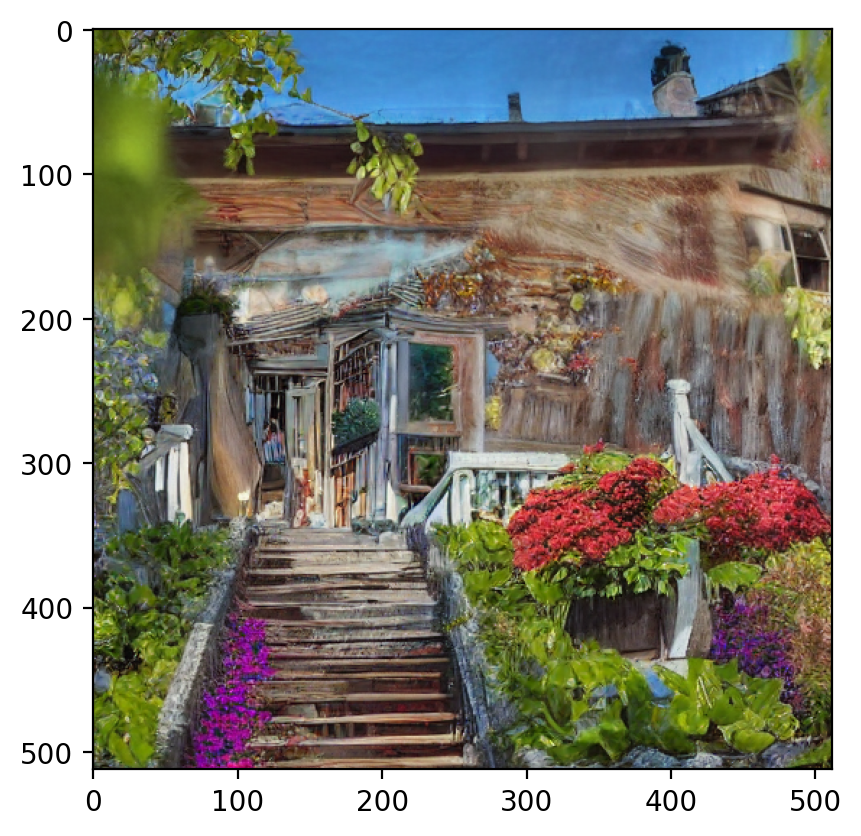

In [31]:
plt.imshow(image[0].permute(1, 2, 0).detach().cpu())

<a name="subtask_name_1_B"></a>
## Task 1.B: Classifier-Free Guidance Experiments

In generative models, there is a well-known concept of "vector arithmetics". The first paper that discovered such arithmetics in the noise domain of generative models, was in GANs literature: [Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks (Section 6.3.2)](https://arxiv.org/abs/1511.06434). If one noise corresponds to Object1 and another to Object2, then the average of these noises correspond to something which looks like an average mixture of Object1 and Object2. This allows to add specific features to an object by moving its noise vector towards some "style" direction.

When we predict $\epsilon$ using Unet conditioned on text, we get $\epsilon_{\text{text}}$ that **implicitly (the model does not explicitly separate the information into this)** contains information about:

1. How, in general, a plausible image should look like? General information that is not related to the actual prompt

2. How should the image look like to be aligned with the prompt? Some prompt-specific features (like having a house on the image, e.g.)


Let's now compute an unconditional (text is set to an empty string) $\epsilon_{\text{uncond}}$. Because there is no condition, this $\epsilon_{\text{uncond}}$ should represent generic information that is not specific to any prompt. Hence if we subtract $\epsilon_{\text{uncond}}$ from $\epsilon_{\text{text}}$, we should get the "style" direction of our diffusion model that make the prediction aligned with the prompt. Thus, to generate an image, we can use the weighted sum of these epsilons:
$$
\epsilon_{\text{total}} = \epsilon_{\text{uncond}} + s \cdot (\epsilon_{\text{text}} - \epsilon_{\text{uncond}}),
$$
where $s$ is the "guidance factor". If $s=0$, there is no conditioning, if $s=1$, we get our standard $\epsilon_{\text{text}}$ and if $s > 1$ the generation is even more aligned with the prompt. This technique is known as classifier-free guidance. See [Classifier-Free Diffusion Guidance](https://arxiv.org/abs/2207.12598) for more details.

Let's rewrite the code from Task 2.A using this equation and explore how different $s$ impacts the generation

In [32]:
# create random latents again

latents = get_latents()

In [33]:
# we need to have unconditional text embedding
text_embeddings_uncond = get_text_embeddings(prompt="")

Instead of running the pipeline twice (with and without condition), we can concatenate the conditioned version with the unconditioned one across the batch dimension and treat it like running the model with batch_size = 2.

In [34]:
total_text_embeddings= torch.cat([text_embeddings, text_embeddings_uncond])

In [46]:
def diffusion_pipeline(orig_latents, s=1.0):
    # copy latents so we can reuse them with different s
    latents = orig_latents.clone()

    for t in tqdm(scheduler.timesteps):
        # concat latents with itself across batch dim to avoid running the model twice
        latents_total = torch.cat([latents] * 2)

        # CONCATENAR LOS EMBEDDINGS TAMBIÉN
        text_embeddings_total = torch.cat([text_embeddings] * 2)

        # predict the noise residual
        with torch.no_grad():
            # pass text_embeddings_total as encoder_hidden_states
            noise_pred = unet(latents_total, t, encoder_hidden_states=text_embeddings_total).sample

        # get noise_text (eps_text) and noise_uncond from noise_pred (split batch)
        noise_text, noise_uncond = noise_pred.chunk(2)
        # use guidance equation to compute noise_total
        noise_total = noise_uncond + s * (noise_text - noise_uncond)

        # use noise_total to update latents
        # compute the previous noisy sample x_t -> x_t-1
        # in HF it is called prev_sample
        # use scheduler.step
        latents = scheduler.step(noise_total, t, latents).prev_sample

    # decode using VAE, move to [0, 1] and convert to image format
    latents = 1 / 0.18215 * latents
    with torch.no_grad():
        image = vae.decode(latents).sample

    image = (image / 2 + 0.5).clamp(0, 1)
    return image[0].permute(1, 2, 0).detach().cpu()

Try different $s$ (small ones from $0$ to $1$ (with something in between), middle (7-8) and very big ones $100$-$1000$, e.g.). Create two arrays: `s_options` with different values of $s$ and corresponding array of images (`images[i]` corresponds to `s_options[i]`). Use the same latents

In [47]:
s_options = [0, 0.5, 1.0, 2.0, 4.0, 7.0, 10.0, 20.0, 50.0, 100.0]  # Valores de s
images = []  # Array para guardar las imágenes

# Usar los mismos latentes iniciales para todas
original_latents = latents.clone()

for s in s_options:
    # Resetear los latentes a los originales
    latents = original_latents.clone()
    # Generar imagen con este s
    img = diffusion_pipeline(latents, s=s)
    images.append(img)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

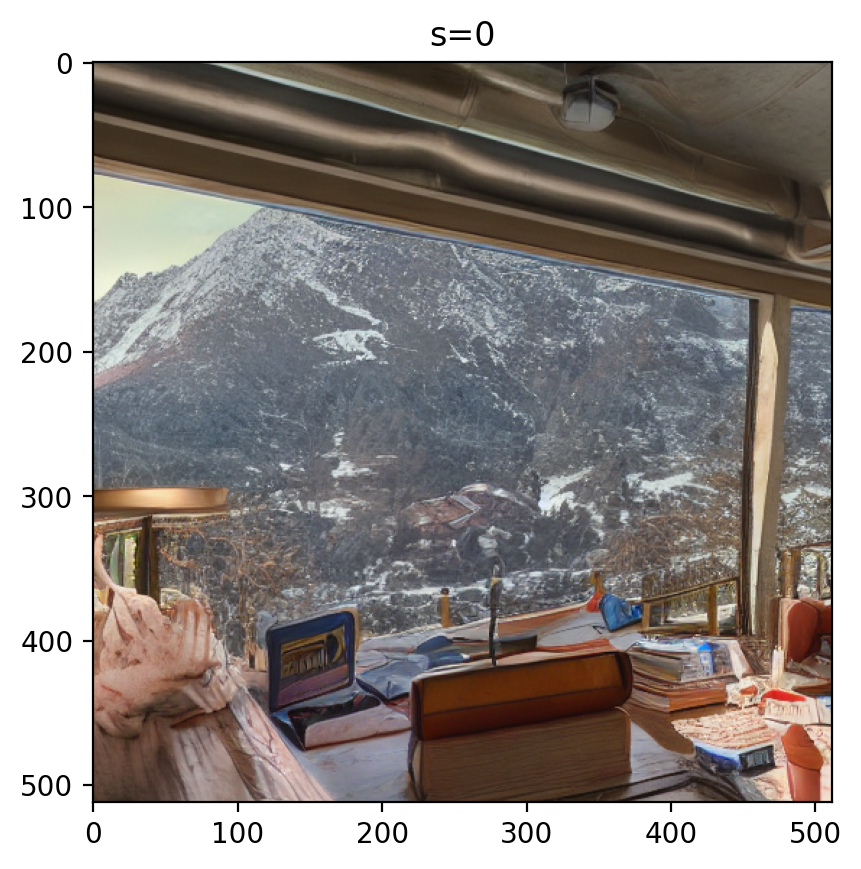

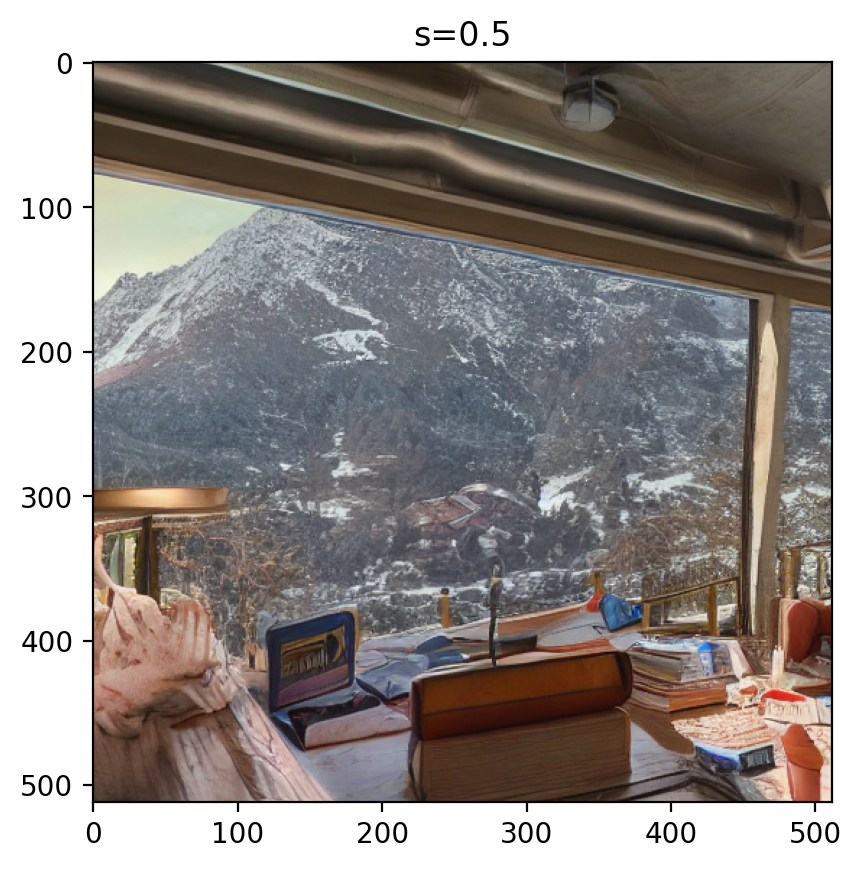

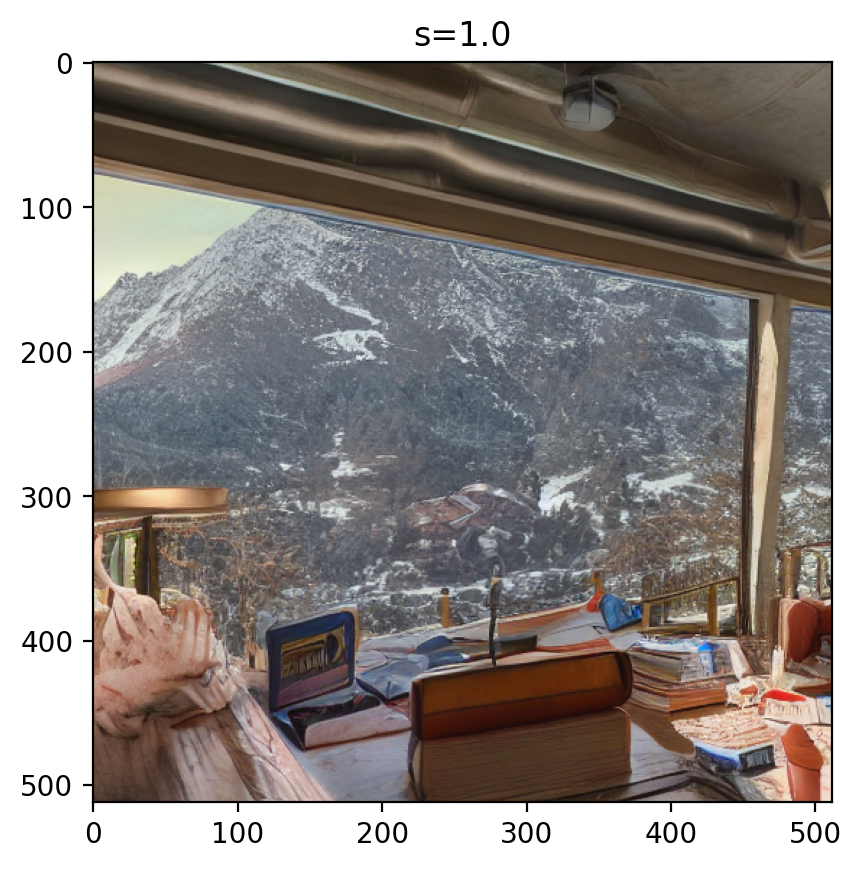

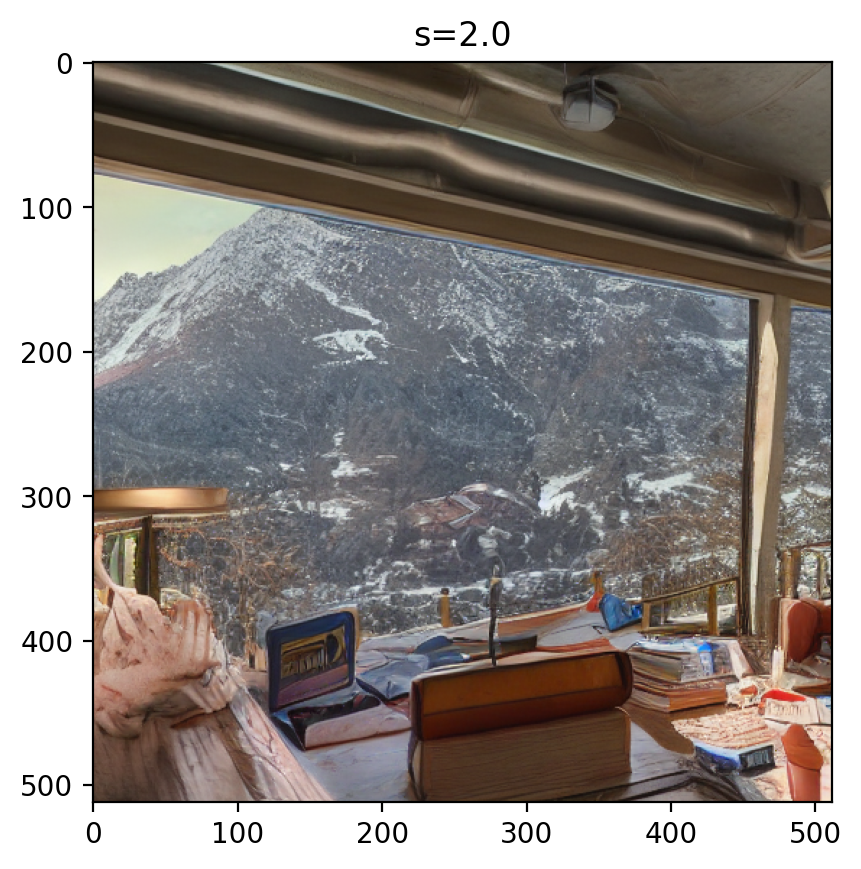

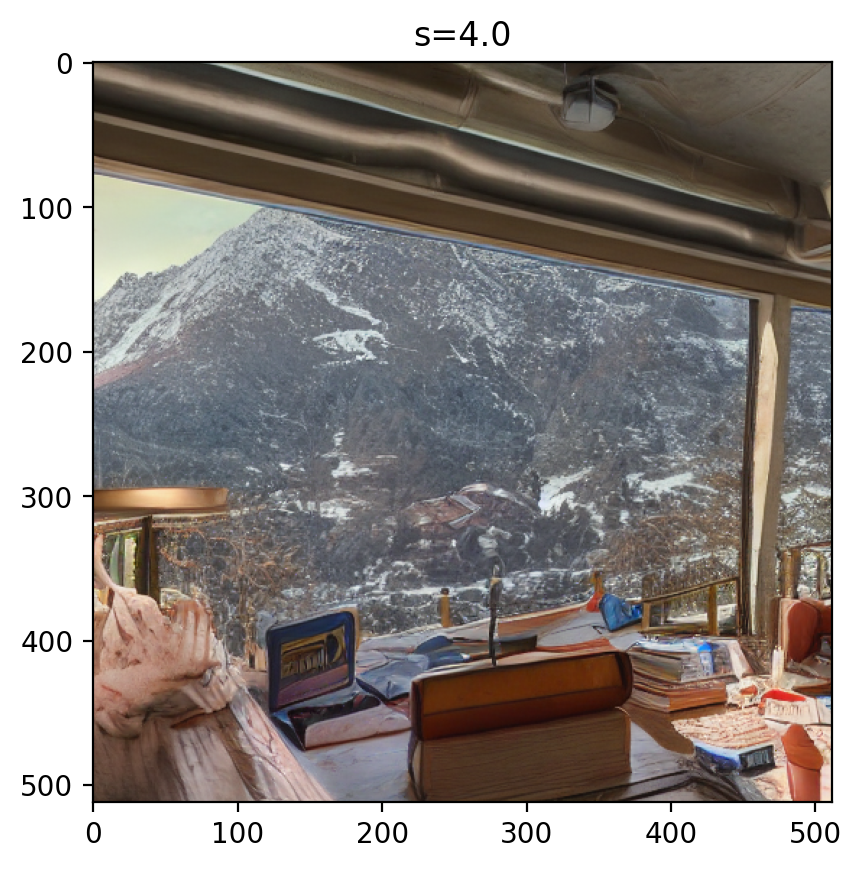

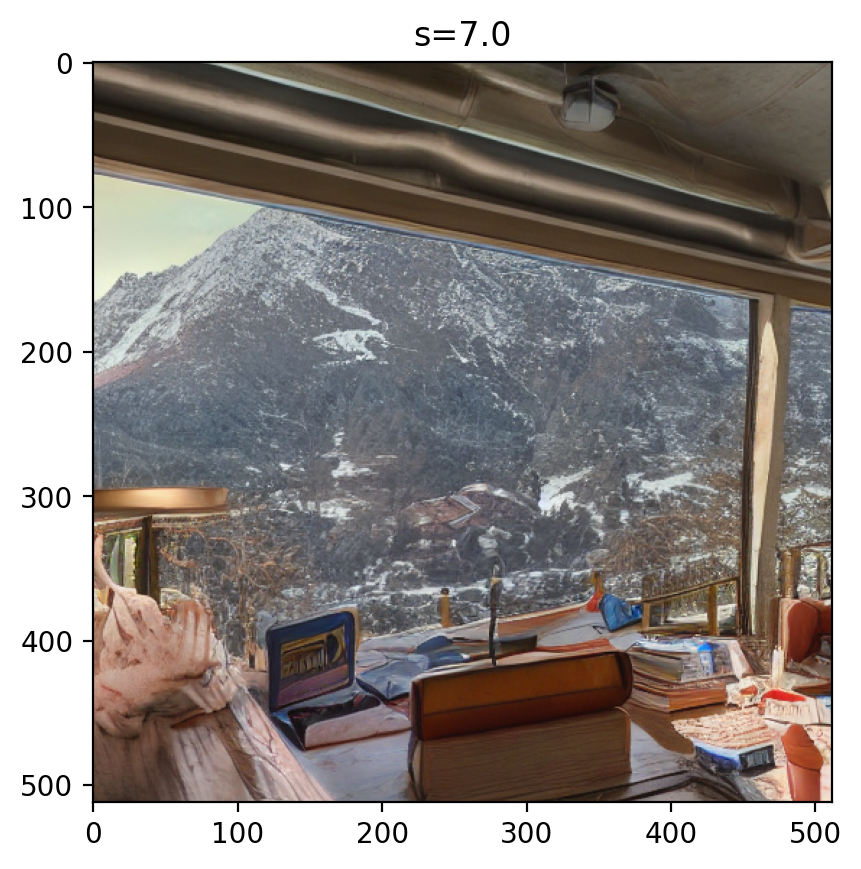

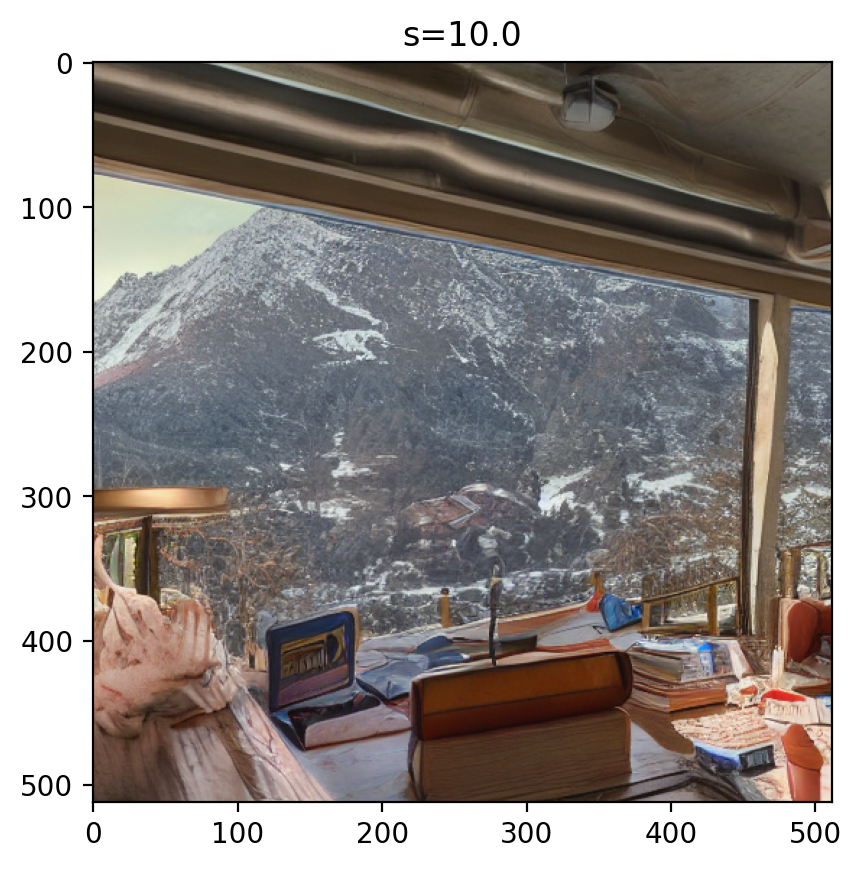

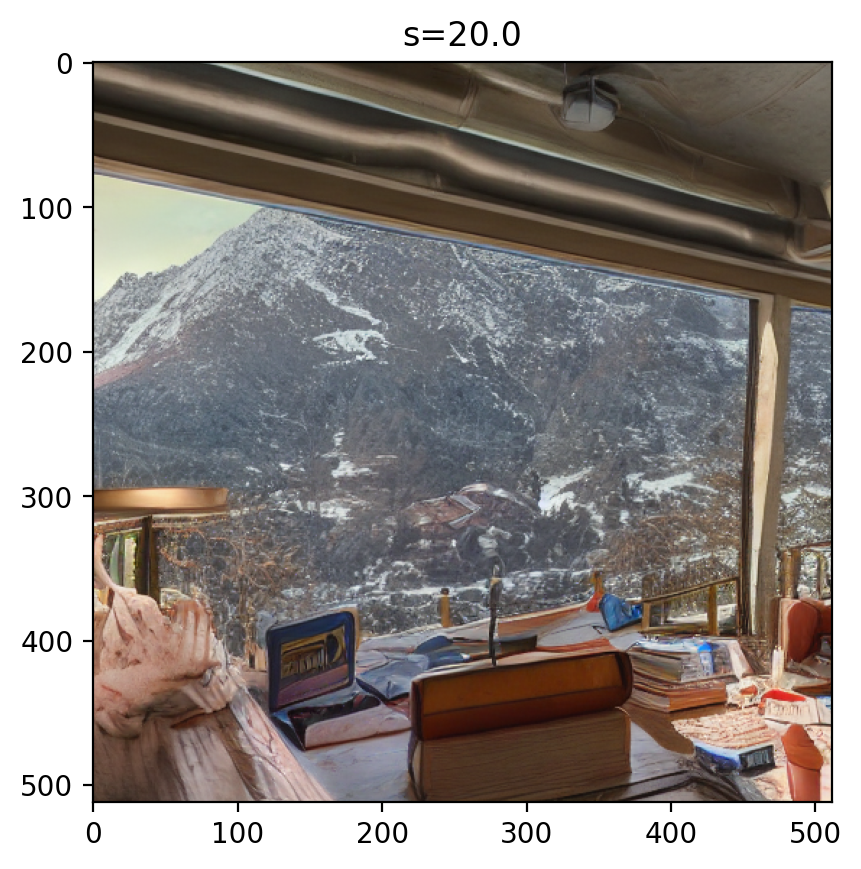

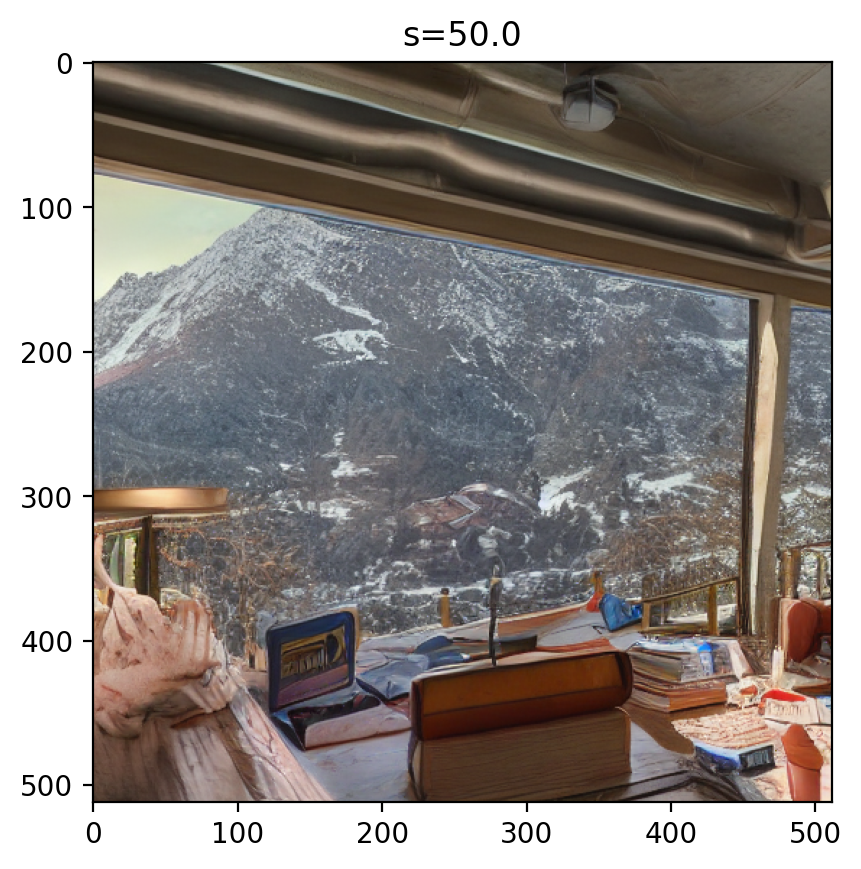

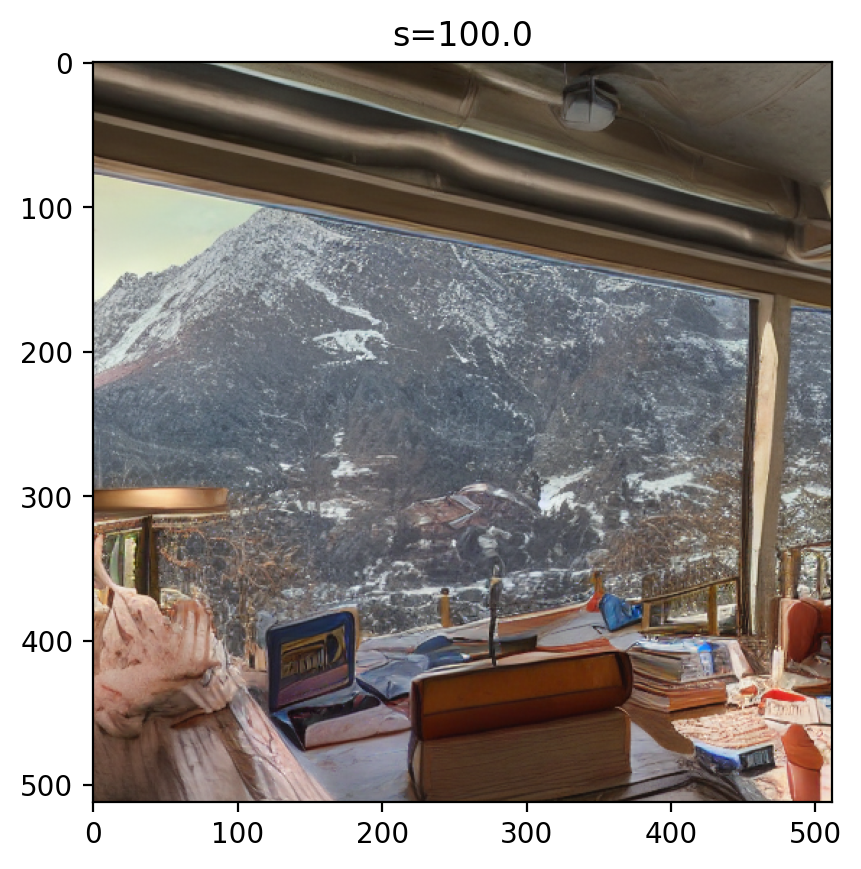

In [48]:
# visualize images
for s, image in zip(s_options, images):
    plt.imshow(image)
    plt.title(f"s={s}")
    plt.show()

Reflect on the generated images for each $s$. How different values of $s$ impact the generation?

Answer: **YOUR ANSWER HERE**

In [ ]:
When you use low guidance, the model gets too creative and makes whatever it wants. With medium guidance, it actually follows your prompt properly. And if you crank it up too high, it overdoes everything and makes ugly, messed-up images.